# 해마체, 대뇌피질 mask Pretrain

In [2]:
# !unzip 'MRI-Hippo.zip'

Archive:  MRI-Hippo.zip
  inflating: label/100label/ADNI_002_S_0295_13722_ACPC/ADNI_002_S_0295_13722_L/ADNI_002_S_0295_13722_L_001.jpg  
  inflating: label/100label/ADNI_002_S_0295_13722_ACPC/ADNI_002_S_0295_13722_L/ADNI_002_S_0295_13722_L_002.jpg  
  inflating: label/100label/ADNI_002_S_0295_13722_ACPC/ADNI_002_S_0295_13722_L/ADNI_002_S_0295_13722_L_003.jpg  
  inflating: label/100label/ADNI_002_S_0295_13722_ACPC/ADNI_002_S_0295_13722_L/ADNI_002_S_0295_13722_L_004.jpg  
  inflating: label/100label/ADNI_002_S_0295_13722_ACPC/ADNI_002_S_0295_13722_L/ADNI_002_S_0295_13722_L_005.jpg  
  inflating: label/100label/ADNI_002_S_0295_13722_ACPC/ADNI_002_S_0295_13722_L/ADNI_002_S_0295_13722_L_006.jpg  
  inflating: label/100label/ADNI_002_S_0295_13722_ACPC/ADNI_002_S_0295_13722_L/ADNI_002_S_0295_13722_L_007.jpg  
  inflating: label/100label/ADNI_002_S_0295_13722_ACPC/ADNI_002_S_0295_13722_L/ADNI_002_S_0295_13722_L_008.jpg  
  inflating: label/100label/ADNI_002_S_0295_13722_ACPC/ADNI_002_S_0295_1

## 파일 경로 설정

In [6]:
from pathlib import Path
Label35_Path = Path("../MRI Hippocampus/label/35label")
Image35_Path = Path("../MRI Hippocampus/original/35")

In [7]:
Label35_Path

PosixPath('../MRI Hippocampus/label/35label')

In [13]:
Label_Path = list(Label35_Path.glob(r"**/*.jpg"))
Image_Path = list(Image35_Path.glob(r"**/*.jpg"))

In [20]:
import pandas as pd

path_list = list(zip(Label_Path, Image_Path))
df = pd.DataFrame(path_list, columns=['Label_path', 'Image_path'])
df.head(2)

,Label_path,Image_path
0,../MRI Hippocampus/label/35label/ADNI_013_S_11...,../MRI Hippocampus/original/35/ADNI_013_S_1186...
1,../MRI Hippocampus/label/35label/ADNI_013_S_11...,../MRI Hippocampus/original/35/ADNI_013_S_1186...


In [21]:
print("Label len:", len(Label_Path))
print("Image len:", len(Image_Path))

Label len: 13230
Image len: 6615


In [25]:
# To Series
Label_Series = pd.Series(Label_Path, name="LABEL").astype(str)
Image_Series = pd.Series(Image_Path, name="IMAGE").astype(str)

print("LABEL LEN:",len(Label_Series))
print("IMAGE LEN:",len(Image_Series))

LABEL LEN: 13230
IMAGE LEN: 6615


In [26]:
print("LABEL TYPE:",type(Label_Series))
print("IMAGE TYPE:",type(Image_Series))

LABEL TYPE: <class 'pandas.core.series.Series'>
IMAGE TYPE: <class 'pandas.core.series.Series'>


In [40]:
print(Label_Series.head(-1))

0        ../MRI Hippocampus/label/35label/ADNI_013_S_11...
1        ../MRI Hippocampus/label/35label/ADNI_013_S_11...
2        ../MRI Hippocampus/label/35label/ADNI_013_S_11...
3        ../MRI Hippocampus/label/35label/ADNI_013_S_11...
4        ../MRI Hippocampus/label/35label/ADNI_013_S_11...
                               ...                        
13224    ../MRI Hippocampus/label/35label/ADNI_127_S_03...
13225    ../MRI Hippocampus/label/35label/ADNI_127_S_03...
13226    ../MRI Hippocampus/label/35label/ADNI_127_S_03...
13227    ../MRI Hippocampus/label/35label/ADNI_127_S_03...
13228    ../MRI Hippocampus/label/35label/ADNI_127_S_03...
Name: LABEL, Length: 13229, dtype: object


In [41]:
print(Image_Series.head(-1))


0       ../MRI Hippocampus/original/35/ADNI_013_S_1186...
1       ../MRI Hippocampus/original/35/ADNI_013_S_1186...
2       ../MRI Hippocampus/original/35/ADNI_013_S_1186...
3       ../MRI Hippocampus/original/35/ADNI_013_S_1186...
4       ../MRI Hippocampus/original/35/ADNI_013_S_1186...
                              ...                        
6609    ../MRI Hippocampus/original/35/ADNI_127_S_0397...
6610    ../MRI Hippocampus/original/35/ADNI_127_S_0397...
6611    ../MRI Hippocampus/original/35/ADNI_127_S_0397...
6612    ../MRI Hippocampus/original/35/ADNI_127_S_0397...
6613    ../MRI Hippocampus/original/35/ADNI_127_S_0397...
Name: IMAGE, Length: 6614, dtype: object


In [45]:
print("LABEL PATH LEN:",len(Label_Series[0]))
print("IMAGE PATH LEN:",len(Image_Series[0]))

LABEL PATH LEN: 118
IMAGE PATH LEN: 94


In [46]:
print("LABEL PATH EXAMPLE:\n",Label_Series[0])
print("LABEL PATH EXAMPLE:\n",Label_Series[6615])
print("---"*10)
print("IMAGE PATH EXAMPLE:\n",Image_Series[0])

LABEL PATH EXAMPLE:
 ../MRI Hippocampus/label/35label/ADNI_013_S_1186_220072_ACPC/ADNI_013_S_1186_220072_R/ADNI_013_S_1186_220072_R_084.jpg
LABEL PATH EXAMPLE:
 ../MRI Hippocampus/label/35label/ADNI_023_S_1289_67303_ACPC/ADNI_023_S_1289_67303_R/ADNI_023_S_1289_67303_R_160.jpg
------------------------------
IMAGE PATH EXAMPLE:
 ../MRI Hippocampus/original/35/ADNI_013_S_1186_220072_ACPC/ADNI_013_S_1186_220072_ACPC_034.jpg


In [47]:
print("LABEL PATH EXAMPLE:\n",Label_Series[200])
print("---"*10)
print("IMAGE PATH EXAMPLE:\n",Image_Series[200])

LABEL PATH EXAMPLE:
 ../MRI Hippocampus/label/35label/ADNI_013_S_1186_220072_ACPC/ADNI_013_S_1186_220072_L/ADNI_013_S_1186_220072_L_179.jpg
------------------------------
IMAGE PATH EXAMPLE:
 ../MRI Hippocampus/original/35/ADNI_130_S_0956_125256_ACPC/ADNI_130_S_0956_125256_ACPC_074.jpg


## Splitting Process

In [52]:
# Step 1) label, original에서 타겟폴더만 가져오기 
Split_Params_For_LABEL = "35label/"
Split_Params_For_IMG = "35/"

L_Main_Path,L_Target_Path = Label_Series[0].split(Split_Params_For_LABEL)
I_Main_Path,I_Target_Path = Image_Series[0].split(Split_Params_For_IMG)

print("LABEL MAIN: ",L_Main_Path)
print("LABEL TARGET: ",L_Target_Path)
print("---"*20)
print("IMG MAIN: ",I_Main_Path)
print("IMG TARGET: ",I_Target_Path)

LABEL MAIN:  ../MRI Hippocampus/label/
LABEL TARGET:  ADNI_013_S_1186_220072_ACPC/ADNI_013_S_1186_220072_R/ADNI_013_S_1186_220072_R_084.jpg
------------------------------------------------------------
IMG MAIN:  ../MRI Hippocampus/original/
IMG TARGET:  ADNI_013_S_1186_220072_ACPC/ADNI_013_S_1186_220072_ACPC_034.jpg


In [53]:
# Step 2 경로를 제외한 파일 이름만 불러오기

Common_Params = "/"

Label_Path_Before,Label_Path_Middle,Label_Path_After = L_Target_Path.split(Common_Params)
IMG_Path_Before,IMG_Path_After = I_Target_Path.split(Common_Params)

print("LABEL BEFORE: ",Label_Path_Before)
print("LABEL MIDDLE: ",Label_Path_Middle)
print("LABEL AFTER: ",Label_Path_After)
print("---"*20)
print("IMG BEFORE: ",IMG_Path_Before)
print("IMG AFTER: ",IMG_Path_After)

LABEL BEFORE:  ADNI_013_S_1186_220072_ACPC
LABEL MIDDLE:  ADNI_013_S_1186_220072_R
LABEL AFTER:  ADNI_013_S_1186_220072_R_084.jpg
------------------------------------------------------------
IMG BEFORE:  ADNI_013_S_1186_220072_ACPC
IMG AFTER:  ADNI_013_S_1186_220072_ACPC_034.jpg


In [54]:
# 파일명 분해하기 
# LABEL TARGET = L | R

List_Split_Params = "_"
Label_Path_Split = Label_Path_After.split(List_Split_Params)
IMG_Path_Split = IMG_Path_After.split(List_Split_Params)

print("LABEL LIST: ",Label_Path_Split)
print("IMG LIST: ",IMG_Path_Split)
print("---"*20)
print("LABEL TARGET: ",Label_Path_Split[-2])
print("IMG TARGET: ",IMG_Path_Split[-1])

LABEL LIST:  ['ADNI', '013', 'S', '1186', '220072', 'R', '084.jpg']
IMG LIST:  ['ADNI', '013', 'S', '1186', '220072', 'ACPC', '034.jpg']
------------------------------------------------------------
LABEL TARGET:  R
IMG TARGET:  034.jpg


In [57]:
if Label_Path_Split[-2] == "L":
    
    print("IT'S LEFT")
            
elif Label_Path_Split[-2] == "R":
     
    print("IT'S RIGHT")

IT'S RIGHT


## Splitting

In [58]:
L_IMG = []
R_IMG = []

Total_IMG = []

Split_Params_For_LABEL = "35label/"
Split_Params_For_IMG = "35/"

Common_Params = "/"

List_Split_Params = "_"

for label_x,image_x in zip(Label_Series,Image_Series):
    
    try:
        
        L_Main_Path,L_Target_Path = label_x.split(Split_Params_For_LABEL)
        I_Main_Path,I_Target_Path = image_x.split(Split_Params_For_IMG)

        Label_Path_Before,Label_Path_Middle,Label_Path_After = L_Target_Path.split(Common_Params)
        IMG_Path_Before,IMG_Path_After = I_Target_Path.split(Common_Params)

        Label_Path_Split = Label_Path_After.split(List_Split_Params)
        IMG_Path_Split = IMG_Path_After.split(List_Split_Params)


        if Label_Path_Split[-2] == "L":

            L_IMG.append(label_x)
            Total_IMG.append(image_x)
            
        elif Label_Path_Split[-2] == "R":
            
            Total_IMG.append(image_x)
            R_IMG.append(label_x)
            
        else:
            print("SOMETHING IS WRONG!")
            
    except:
        print("LABEL: ",label_x)
        print("IMG: ",image_x)
    


In [59]:
print("IMG :",len(Total_IMG))
print("LABEL L:",len(L_IMG))
print("LABEL R:",len(R_IMG))

IMG : 6615
LABEL L: 3402
LABEL R: 3213


In [60]:
# 파일 정렬
Sort_L = sorted(L_IMG)
Sort_R = sorted(R_IMG)
Sort_IMG = sorted(Total_IMG)

In [61]:
print(Sort_L[0])
print(Sort_R[0])
print(Sort_IMG[0])

../MRI Hippocampus/label/35label/ADNI_002_S_1070_130146_ACPC/ADNI_002_S_1070_130146_L/ADNI_002_S_1070_130146_L_001.jpg
../MRI Hippocampus/label/35label/ADNI_002_S_1070_130146_ACPC/ADNI_002_S_1070_130146_R/ADNI_002_S_1070_130146_R_001.jpg
../MRI Hippocampus/original/35/ADNI_002_S_0685_18211_tal_noscale/ADNI_002_S_0685_18211_tal_noscale_001.jpg


In [62]:
print(Sort_L[1])
print(Sort_R[1])
print(Sort_IMG[1])

../MRI Hippocampus/label/35label/ADNI_002_S_1070_130146_ACPC/ADNI_002_S_1070_130146_L/ADNI_002_S_1070_130146_L_002.jpg
../MRI Hippocampus/label/35label/ADNI_002_S_1070_130146_ACPC/ADNI_002_S_1070_130146_R/ADNI_002_S_1070_130146_R_002.jpg
../MRI Hippocampus/original/35/ADNI_002_S_0685_18211_tal_noscale/ADNI_002_S_0685_18211_tal_noscale_002.jpg


In [63]:
print(Sort_L[2])
print(Sort_R[2])
print(Sort_IMG[2])

../MRI Hippocampus/label/35label/ADNI_002_S_1070_130146_ACPC/ADNI_002_S_1070_130146_L/ADNI_002_S_1070_130146_L_003.jpg
../MRI Hippocampus/label/35label/ADNI_002_S_1070_130146_ACPC/ADNI_002_S_1070_130146_R/ADNI_002_S_1070_130146_R_003.jpg
../MRI Hippocampus/original/35/ADNI_002_S_0685_18211_tal_noscale/ADNI_002_S_0685_18211_tal_noscale_003.jpg


## HIPPOCAMPUS CHECK

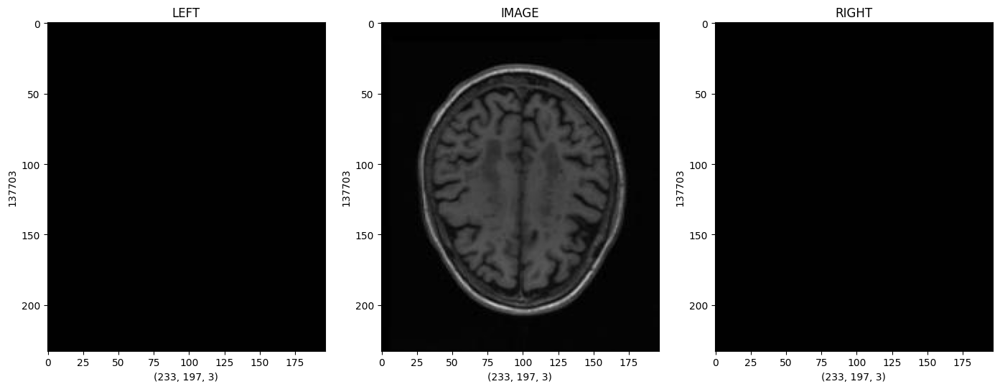

In [66]:
import cv2
import matplotlib.pyplot as plt

figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[100]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[100]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[100]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

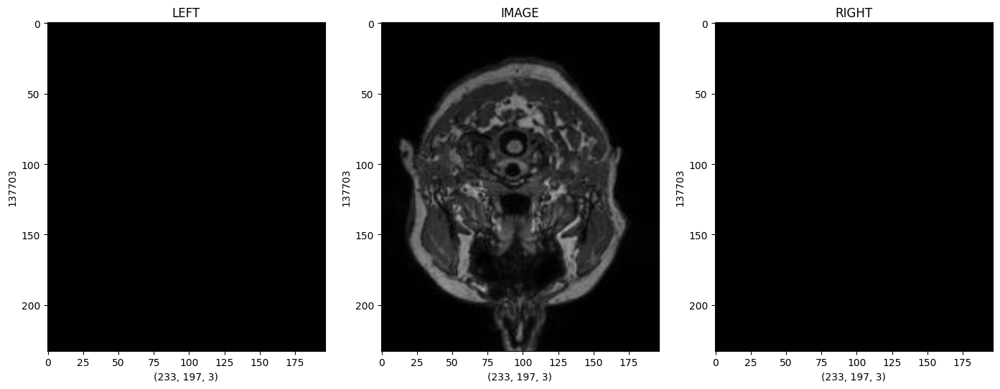

In [67]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[200]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[200]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[200]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

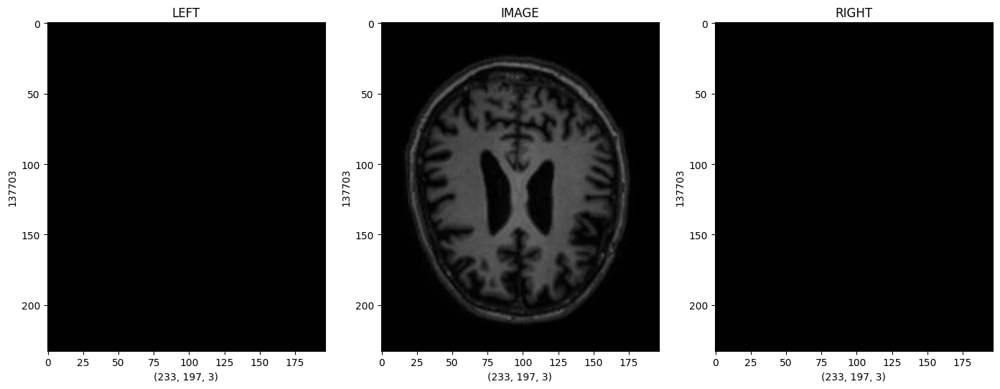

In [68]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[300]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[300]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[300]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

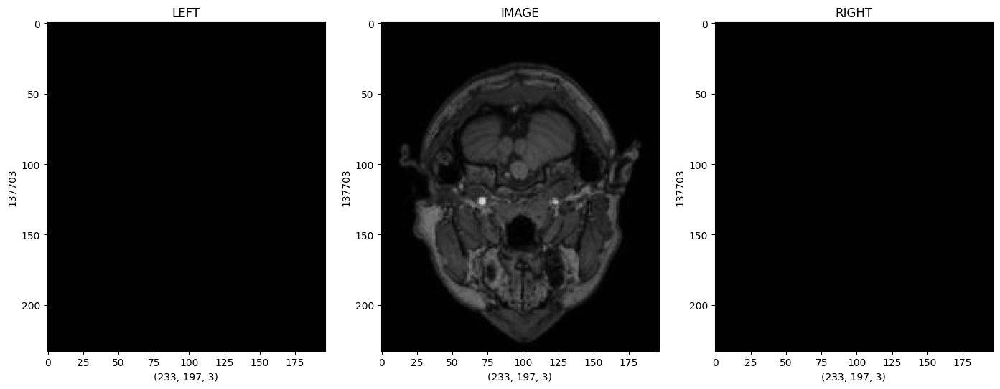

In [69]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[400]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[400]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[400]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

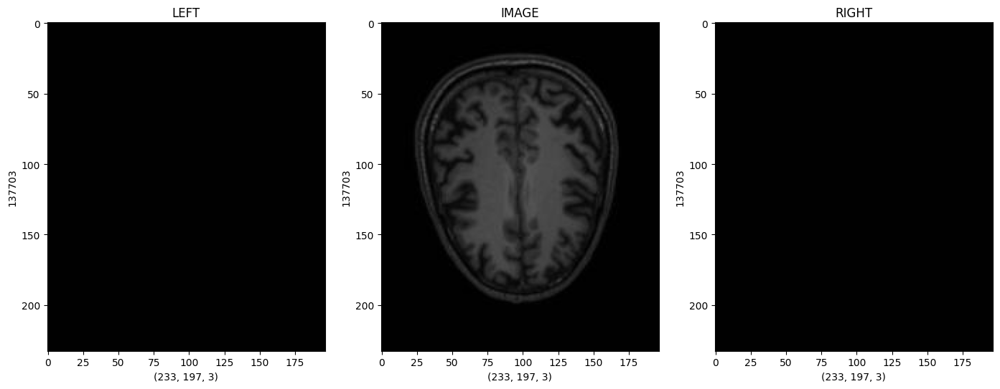

In [70]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[500]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[500]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[500]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

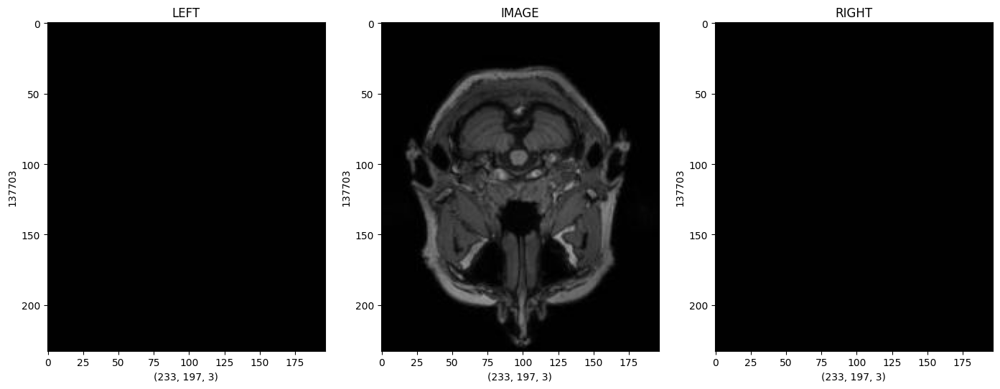

In [71]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[600]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[600]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[600]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

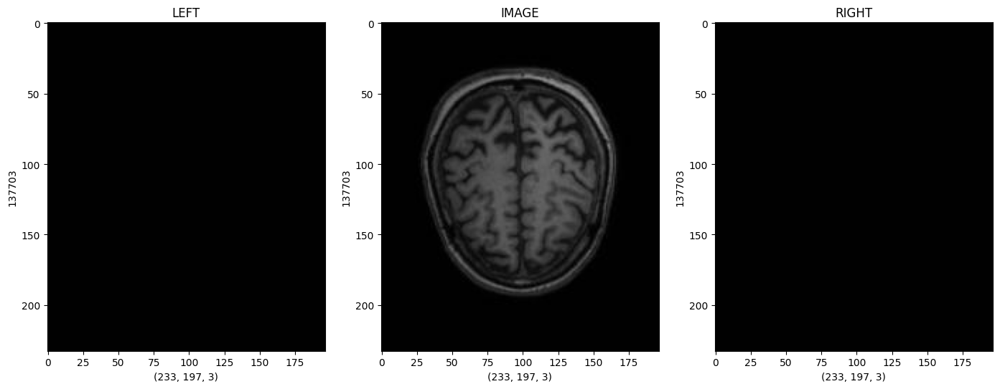

In [72]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[700]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[700]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[700]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

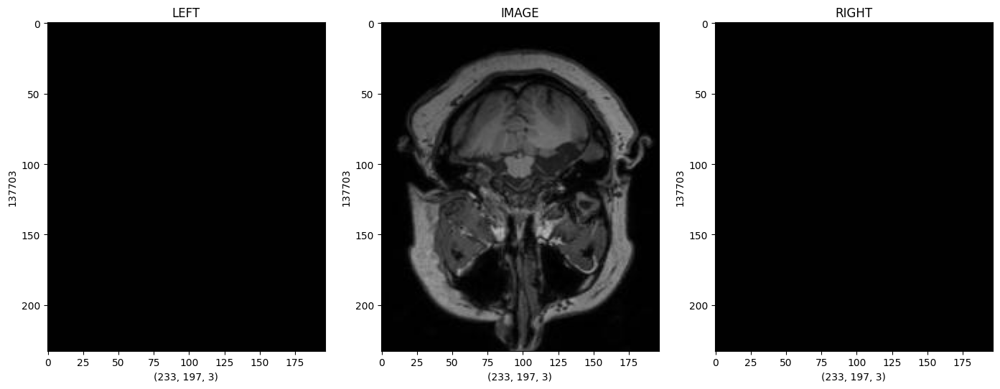

In [73]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[800]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[800]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[800]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

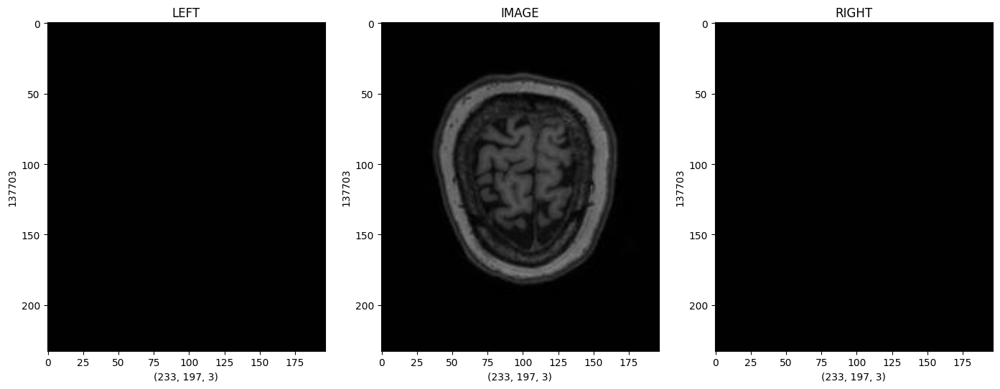

In [75]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[900]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[900]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[900]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

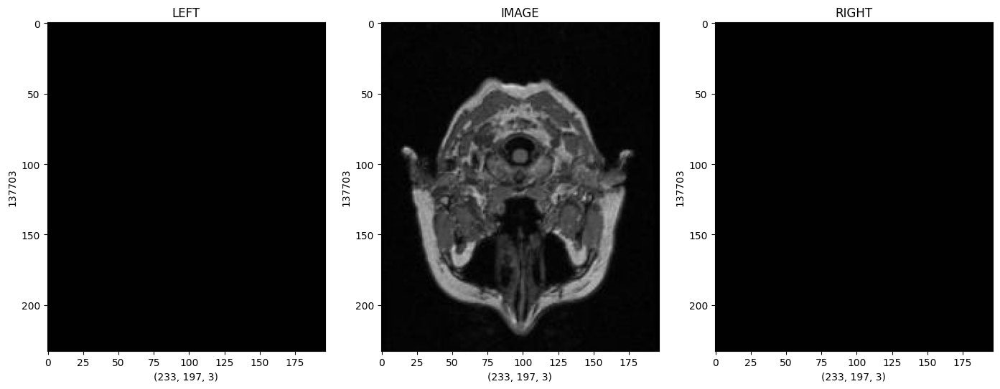

In [77]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[950]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[950]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[950]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

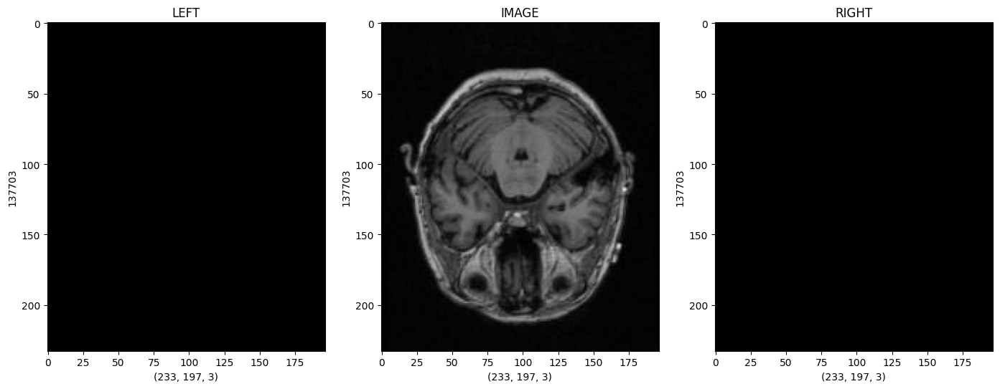

In [78]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[988]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[988]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[988]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

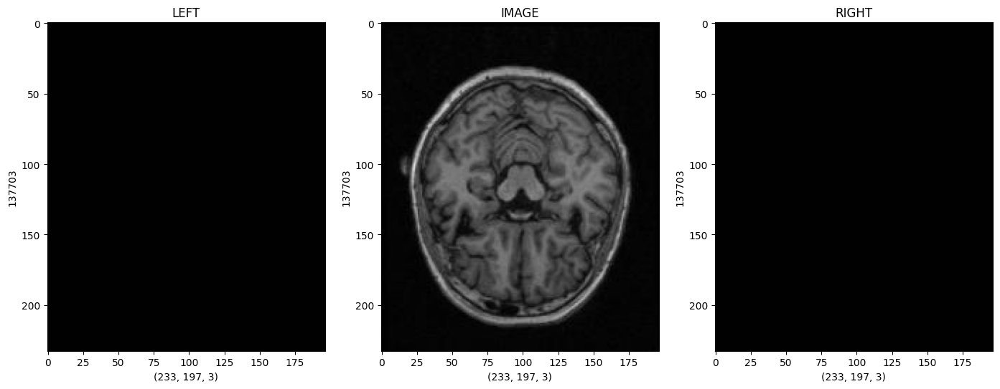

In [79]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1000]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

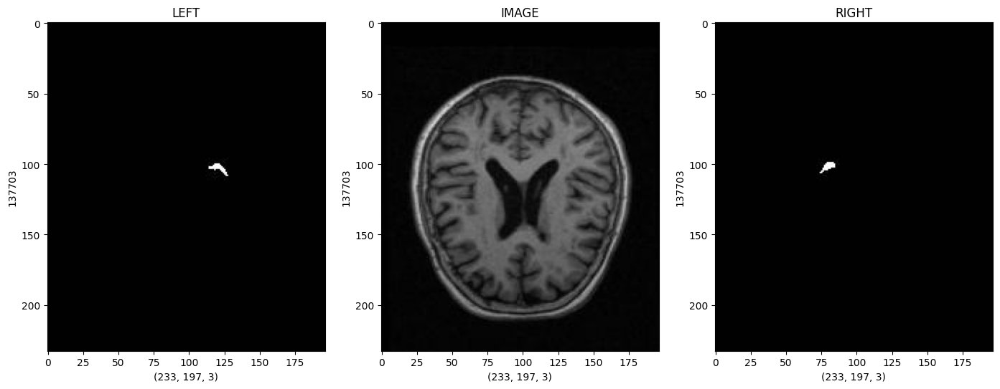

In [80]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1030]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1030]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1030]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

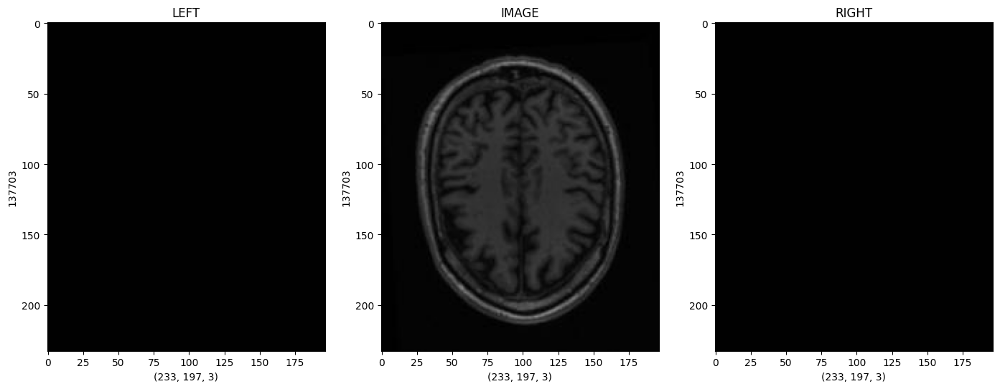

In [81]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[2000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[2000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[2000]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

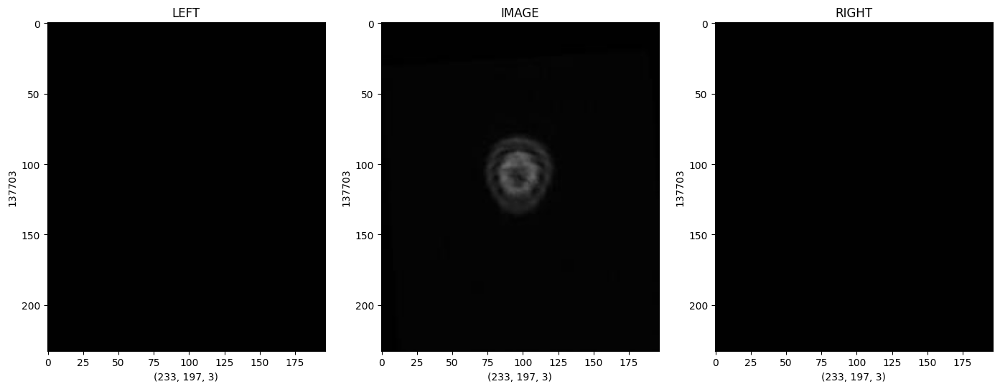

In [82]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[2050]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[2050]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[2050]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

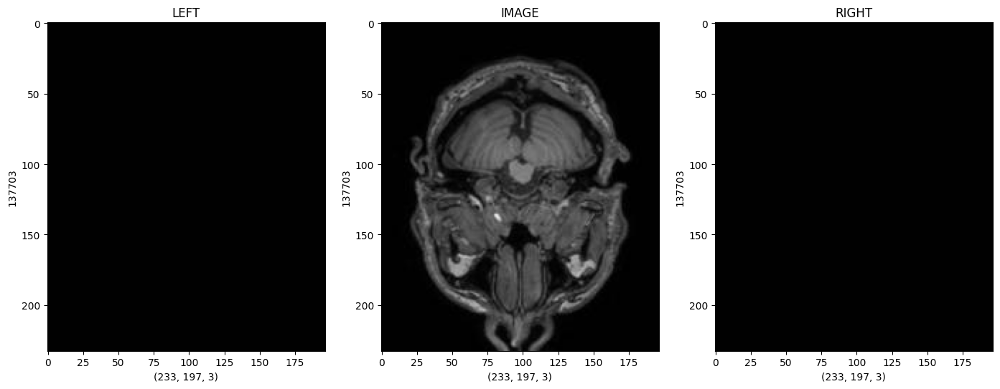

In [83]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[2300]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[2300]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[2300]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

## MRI ROUND

<function matplotlib.pyplot.show(close=None, block=None)>

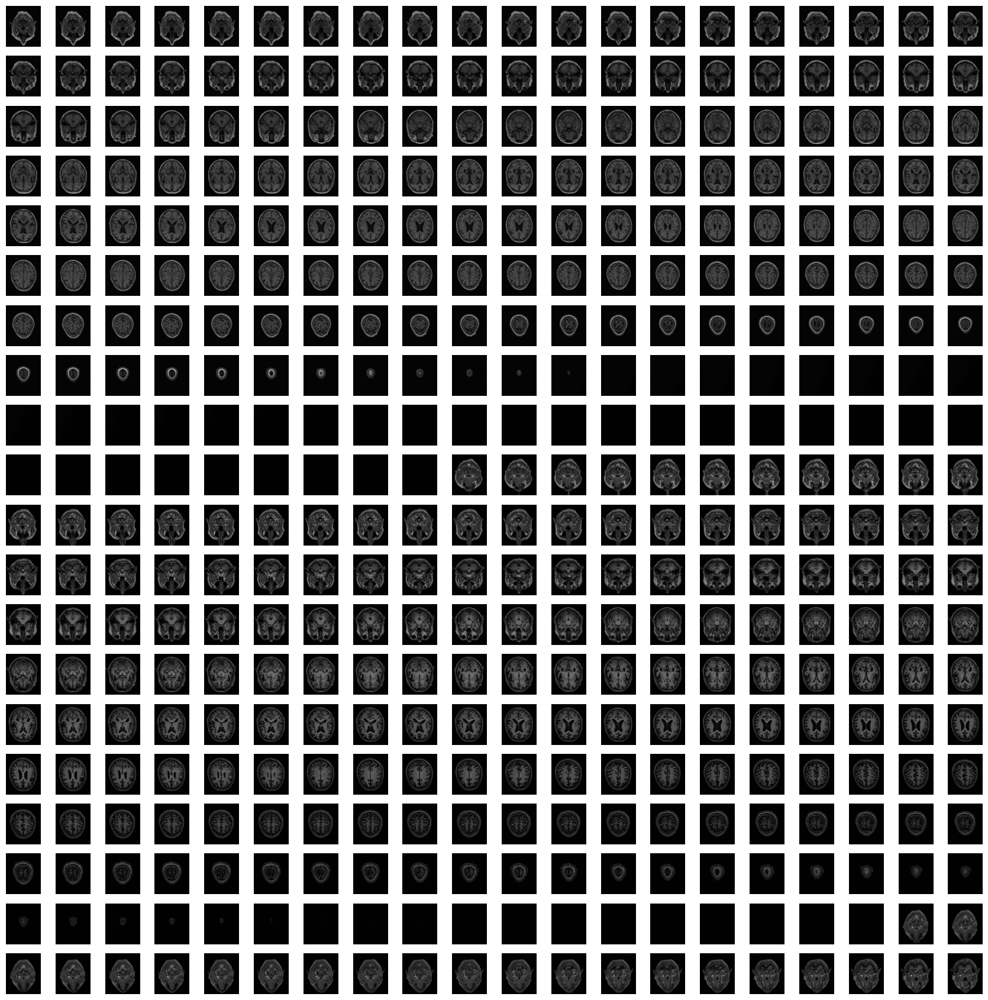

In [87]:
figure, axis = plt.subplots(20,20,figsize=(17,17))

for indexing, operations in enumerate(axis.flat):

    Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[indexing]), cv2.COLOR_BGR2RGB)

    operations.imshow(Example_IMG)
    operations.axis("off")

plt.tight_layout()
plt.show